# OpenCV fundamentals


OPENCV/PYTHON FUNDAMENTALS

Nir Herscovici | nir.herscovici@timet.com

1. Opening files from a local device.
2. Viewing values stored in a image-pixel array.
3. Classical image processing techniques.



## Python getting started

1. First we need to import the relevant libraries:
  * OpenCV, Numpy and others

2. Download relevant video handling scripts from GitHub


In [1]:

# Download the test image and utils files

!wget --no-check-certificate \
    https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/pcc.png \
    -O pcc.png
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py

# These imports let you use opencv
import cv2 #opencv itself
import common #some useful opencv functions
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
%matplotlib inline
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

--2023-10-09 19:00:29--  https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/pcc.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2561744 (2.4M) [image/png]
Saving to: ‘pcc.png’

pcc.png             100%[===================>]   2.44M  --.-KB/s    in 0.08s   

2023-10-09 19:00:30 (28.9 MB/s) - ‘pcc.png’ saved [2561744/2561744]

--2023-10-09 19:00:30--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6572 (6.4K) [text/p

In [2]:
input_image=cv2.imread('pcc.png') # Command to read image on file

We can find out various things about that image

In [3]:
print(input_image.size) # command to print image size (wxh) units of pixels

11445372


In [4]:
print(input_image.shape) # Image shape. Shape consists of (width, height, # of channels). Channels for a colored image are 3.



(1102, 3462, 3)


In [5]:
print(input_image.dtype) # Data type describes the variable types being stored within each image pixel. uint8 is an integer value of base 8.

uint8


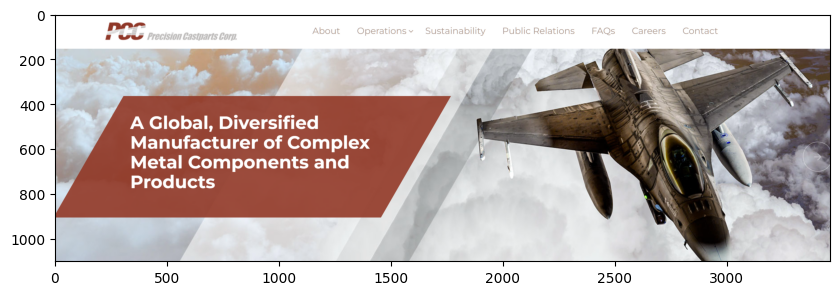

In [6]:
plt.imshow(input_image) # plt.imshow is a matplolib function to plot an opencv image on a traditional XY chart.

What the chart above illustrates, isa key aspect of OpenCV: Images stored in openCV are formated in non-standard B,G,R rather than R,G,B (Red, Blue, Green).

OpenCV provides a framework to split the number of color channels and reorganize.

Code below exemplifies the following:
1. splitting the input image into component form: blue, green, red
2. Plotting ONLY the 'red' channel on a 'grayscale' map.

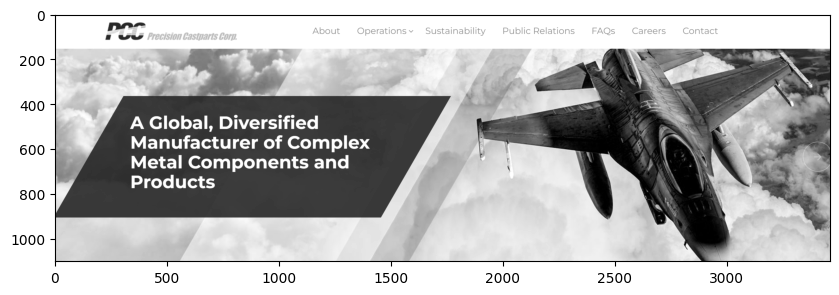

In [7]:
# split channels
b,g,r=cv2.split(input_image)
# show one of the channels (this is red - see that the sky is kind of dark. try changing it to b)
plt.imshow(r, cmap='gray')


## converting between colour spaces, merging and splitting channels

We can convert between various colourspaces in OpenCV easily. We've seen how to split, above. We can also merge channels:

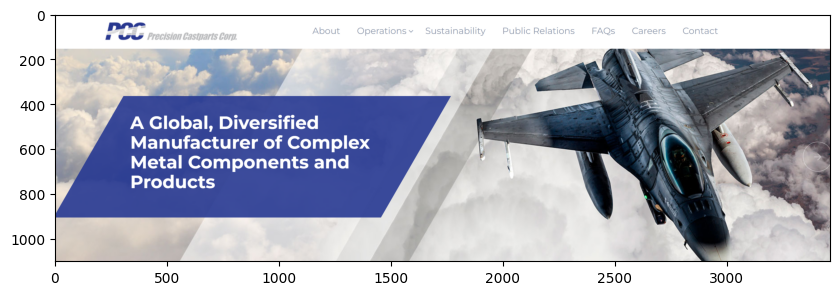

In [8]:
merged=cv2.merge([r,g,b])
# merge takes an array of single channel matrices
plt.imshow(merged)


OpenCV also has a function specifically for dealing with image colorspaces, so rather than split and merge channels by hand you can use this instead. It is usually marginally faster...

There are over 250 different color related flags in OpenCV for conversion and display. The ones you are most likely to use are COLOR_BGR2RGB for RGB conversion, COLOR_BGR2GRAY for conversion to greyscale, and COLOR_BGR2HSV for conversion to Hue,Saturation,Value colour space. [http://docs.opencv.org/trunk/de/d25/imgproc_color_conversions.html] has more information on how these colour conversions are done.

In [9]:
COLORflags = [flag for flag in dir(cv2) if flag.startswith('COLOR') ]
print(len(COLORflags))

# If you want to see them all, rather than just a count uncomment the following line
#print(COLORflags)

368


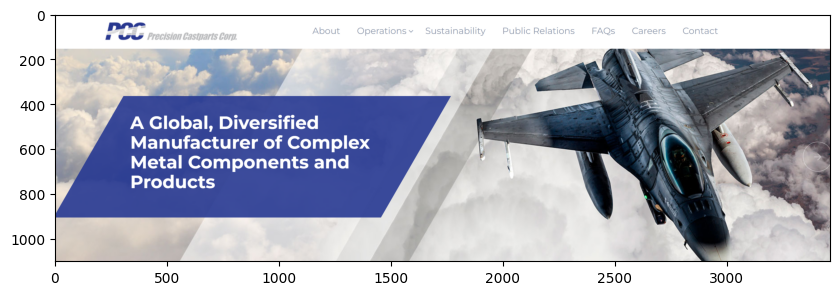

In [10]:
opencv_merged=cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
plt.imshow(opencv_merged)


## Getting image data and setting image data

Images in python OpenCV are numpy arrays. Numpy arrays are optimised for fast array operations and so there are usually fast methods for doing array calculations which don't actually involve writing all the detail yourself. So it's usually bad practice to access individual pixels, but you can.

In [11]:
pixel = opencv_merged[100,100]
print(pixel)

[255 255 255]


In [12]:
input_image[100,100] = [0,0,0]
pixelnew = input_image[100,100]
print(pixelnew)

[0 0 0]


## Getting and setting regions of an image

In the same way as we can get or set individual pixels, we can get or set regions of an image. This is a particularly useful way to get a region of interest to work on.

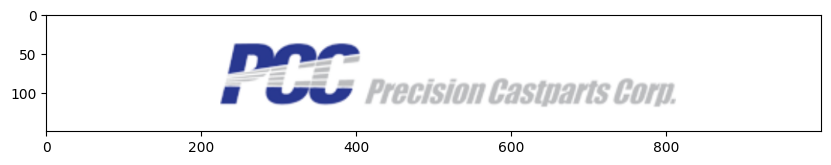

In [13]:
image_crop = opencv_merged[0:150, 0:1000]
plt.imshow(image_crop)

150
1000


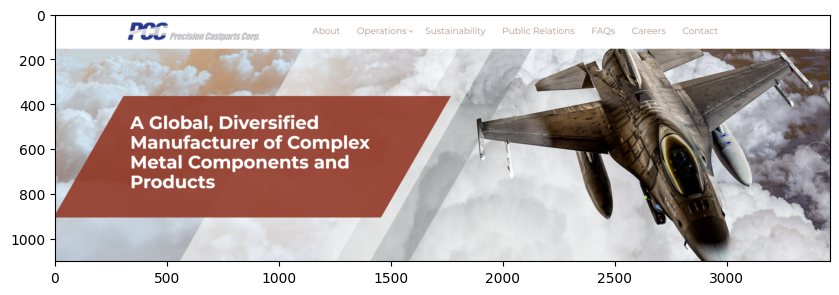

In [14]:
fresh_image=cv2.imread('pcc.png')


fresh_image[0:0+image_crop.shape[0], 100:100+image_crop.shape[1]]=image_crop
print(image_crop.shape[0])
print(image_crop.shape[1])
plt.imshow(fresh_image)

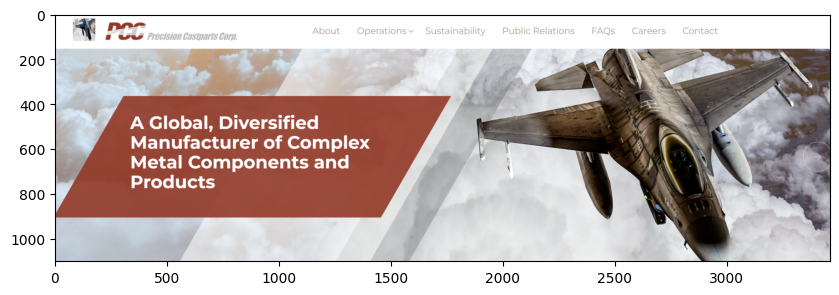

In [15]:
##### Exercise:

#1. Upload a fresh copy of "pcc.png"
#2. CROP the area within the image that contains the airplane
#3. RESIZE the image to 100,100. Use the function cv2.resize(image, (100,100))
# Merge it at the top left corner near the logo PCC

freshim2 = cv2.imread("pcc.png")
frame = freshim2
freshim2=cv2.cvtColor(freshim2, cv2.COLOR_BGR2RGB)
top_y = 200
bottom_y = 1200
left_x = 1700
right_x = 3300
crop = freshim2[top_y:bottom_y, left_x:right_x]
plt.imshow(crop)

crop = cv2.resize(crop, (100, 100))
frame[20:20+crop.shape[0], 80:80+crop.shape[1]]=crop

plt.imshow(frame)

## Matrix slicing
In OpenCV python style, as I have mentioned, images are numpy arrays. There are some superb array manipulation in numpy tutorials out there: this is a great introduction if you've not done it before [http://www.scipy-lectures.org/intro/numpy/numpy.html#indexing-and-slicing]. The getting and setting of regions above uses slicing, though, and I'd like to finish this notebook with a little more detail on what is going on there.

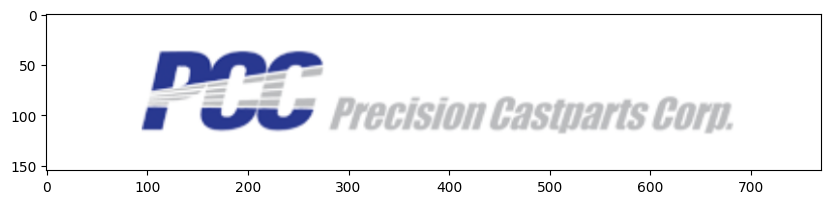

In [16]:
freshim2 = cv2.imread("pcc.png")
freshim2=cv2.cvtColor(freshim2, cv2.COLOR_BGR2RGB)
top_y = 0
bottom_y = 155
left_x = 130
right_x = 900
crop = freshim2[top_y:bottom_y, left_x:right_x]
plt.imshow(crop)

The key thing to note here is that the slicing works like
```
[top_y:bottom_y, left_x:right_x]
```
This can also be thought of as
```
[y:y+height, x:x+width]
```

You can also use slicing to separate out channels.  In this case you want
```
[y:y+height, x:x+width, channel]
```
where channel represents the colour you're interested in - this could be 0 = blue, 1 = green or 2=red if you're dealing with a default OpenCV image, but if you've got an image that has been converted it could be something else. Here's an example that converts to HSV then selects the S (Saturation) channel of the same crop above:

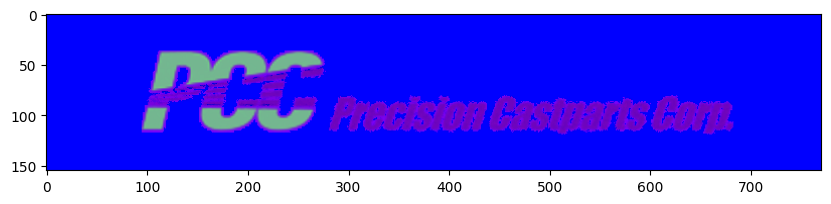

In [17]:
freshim2=cv2.cvtColor(freshim2, cv2.COLOR_RGB2BGR)
hsvim=cv2.cvtColor(freshim2,cv2.COLOR_BGR2HSV)
bcrop =hsvim[top_y:bottom_y, left_x:right_x]
plt.imshow(bcrop, cmap="gray")

# Image stats and image processing
This notebook follows on from the fundamentals notebook.

This will introduce some simple stats, smoothing, and basic image processing.

But first let us include what we need to include and load up our test image.

<p>
 Estimated time needed: <strong>20 min</strong>
</p>

In [18]:
# Download the test image and utils files

!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py
# these imports let you use opencv
import cv2 #opencv itself
import common #some useful opencv functions
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
%matplotlib inline
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

input_image=cv2.imread('pcc.png')

--2023-10-09 19:00:49--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6572 (6.4K) [text/plain]
Saving to: ‘common.py’

common.py           100%[===================>]   6.42K  --.-KB/s    in 0s      

2023-10-09 19:00:49 (52.1 MB/s) - ‘common.py’ saved [6572/6572]



## Basic manipulations

Rotate, flip...

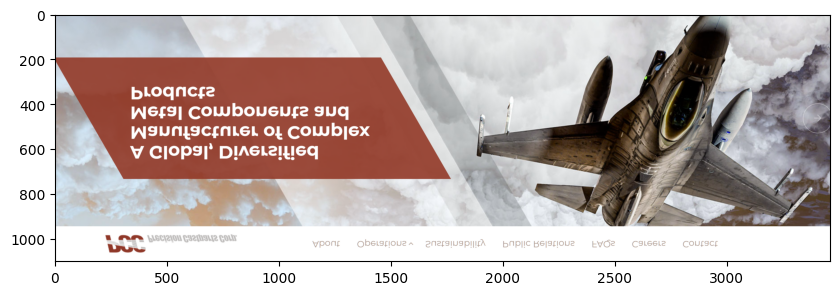

In [19]:
flipped_code_0=cv2.flip(input_image,0) # vertical flip
plt.imshow(flipped_code_0)

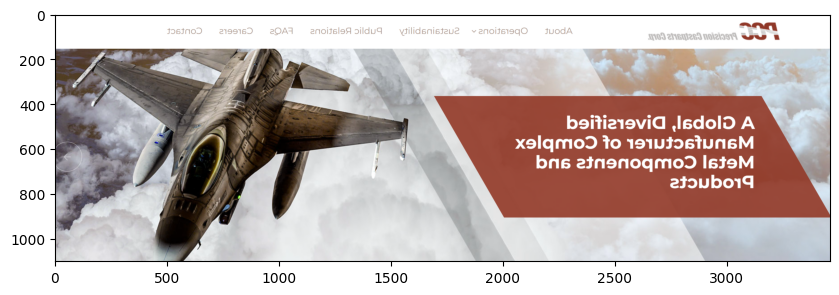

In [20]:
flipped_code_1=cv2.flip(input_image,1) # horizontal flip
plt.imshow(flipped_code_1)

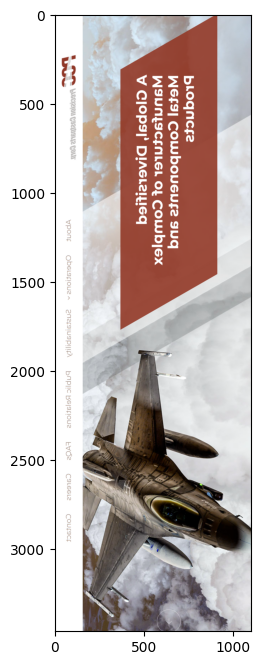

In [21]:
transposed=cv2.transpose(input_image)
plt.imshow(transposed)

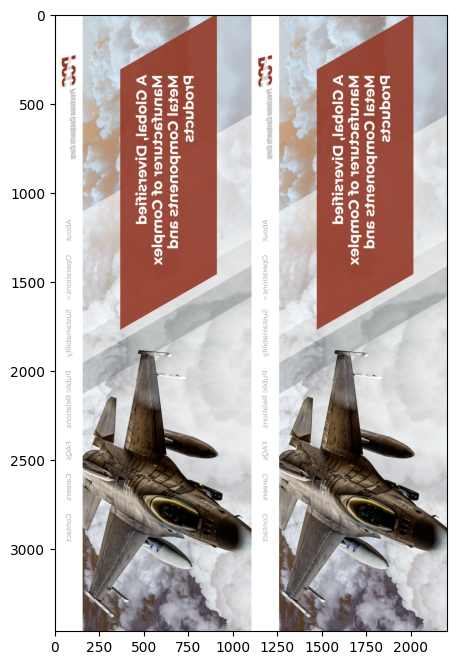

In [22]:
### EXERCISE

# UPLOAD 2x pcc.png.
# Flip the images vertically
# Concatenate the images together to give an effect 2x image width.
# To concatenate.. use the following: input_image = cv2.hconcat([img1, img2])

input_image=cv2.imread('pcc.png')
input_image_2 = input_image # Declare another image variable - this will essentially make a copy of pcc.png
transposed=cv2.transpose(input_image) # Transpose (flip) image
transposed2=cv2.transpose(input_image_2) # Transpose second image
plt.imshow(transposed)

input_image = cv2.hconcat([transposed, transposed2]) # Horizontally concatenate
plt.imshow(input_image)


## Classical Image processing: Feature search

Quickly sorting through image data and searching for image features of certain color format is a powerful tool.

In this exercise, we look for darker areas wthin an image by converting the pixel bitmap to binary (black,white) - and then highlight darker areas. This is called "salt and pepper sorting"

--2023-10-09 19:00:58--  https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/salt_and_pepper.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 363655 (355K) [image/jpeg]
Saving to: ‘salt_and_pepper.jpg’

salt_and_pepper.jpg 100%[===================>] 355.13K  --.-KB/s    in 0.05s   

2023-10-09 19:00:58 (6.89 MB/s) - ‘salt_and_pepper.jpg’ saved [363655/363655]



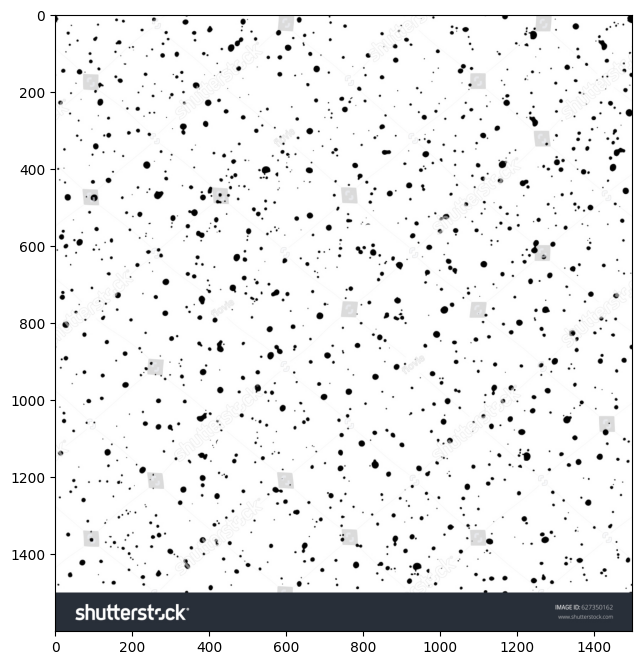

In [23]:
!wget --no-check-certificate \
    https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/salt_and_pepper.jpg \
    -O salt_and_pepper.jpg

input_image = cv2.imread("salt_and_pepper.jpg")
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))

black_px [[  0 138   0]
 [  0 138   1]
 [  0 138   2]
 ...
 [239 129   0]
 [239 129   1]
 [239 129   2]]


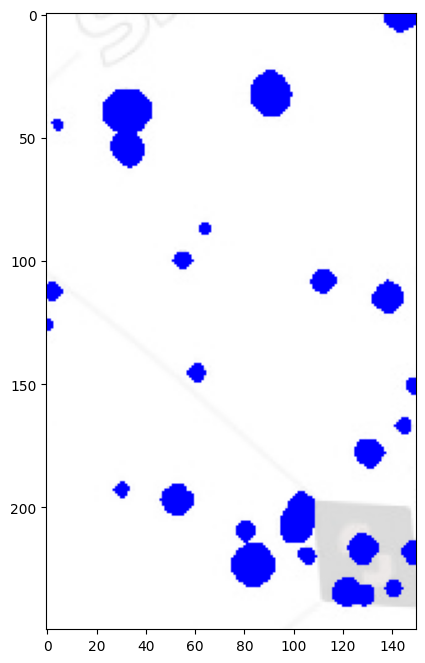

In [24]:
# Convert the image to grayscale
#gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
gray = input_image
top_y = 250
bottom_y = 500
left_x = 300
right_x = 450
gray = gray[top_y:bottom_y, left_x:right_x]
plt.imshow(gray)

# Threshold the grayscale image to create a binary image
_, binary_image = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

# Find the coordinates of black pixels
black_pixels = np.argwhere(binary_image == 0)
print("black_px", black_pixels)
# Calculate the centers of the black areas
center_x = int(np.mean(black_pixels[:, 1]))
center_y = int(np.mean(black_pixels[:, 0]))

for pixel in black_pixels:
    center_x, center_y = pixel[1], pixel[0]
    cv2.circle(input_image[top_y:bottom_y, left_x:right_x], (center_x, center_y), 1, (0, 0, 255), 1)  # Draw a red filled circle


plt.imshow(input_image[top_y:bottom_y, left_x:right_x])

## Arithmetic operations on images

OpenCV has a lot of functions for doing mathematics on images. Some of these have "analogous" numpy alternatives, but it is nearly always better to use the OpenCV version. The reason for this that OpenCV is designed to work on images and so handles overflow better (OpenCV add, for example, truncates to 255 if the datatype is image-like and 8 bit; Numpy's alternative wraps around).

Useful arithmetic operations include add and addWeighted, which combine two images that are the same size.

## Noise reduction
Noise reduction usually involves blurring/smoothing an image using a Gaussian kernel.
The width of the kernel determines the amount of smoothing.

--2023-10-09 19:00:59--  https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/hot_billet.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2377913 (2.3M) [image/jpeg]
Saving to: ‘hot_billet.jpg’

hot_billet.jpg      100%[===================>]   2.27M  --.-KB/s    in 0.08s   

2023-10-09 19:01:00 (28.1 MB/s) - ‘hot_billet.jpg’ saved [2377913/2377913]



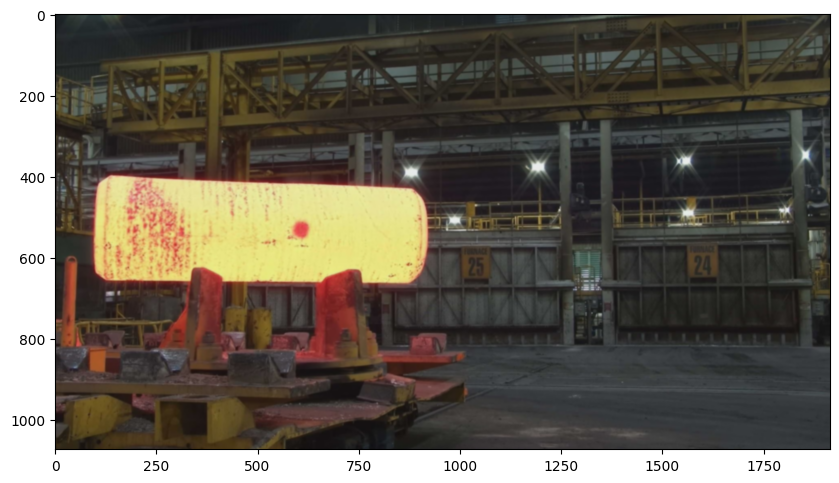

In [25]:
!wget --no-check-certificate \
    https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/hot_billet.jpg \
    -O hot_billet.jpg

input_image = cv2.imread("hot_billet.jpg")
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))

d=3
img_blur3 = cv2.GaussianBlur(input_image, (2*d+1, 2*d+1), -1)[d:-d,d:-d]

plt.imshow(cv2.cvtColor(img_blur3, cv2.COLOR_BGR2RGB))

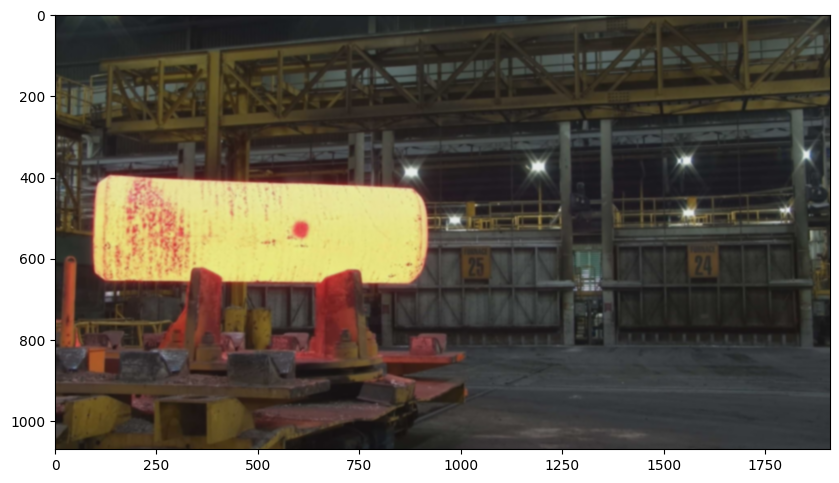

In [26]:
d=5
img_blur5 = cv2.GaussianBlur(input_image, (2*d+1, 2*d+1), -1)[d:-d,d:-d]

plt.imshow(cv2.cvtColor(img_blur5, cv2.COLOR_BGR2RGB))

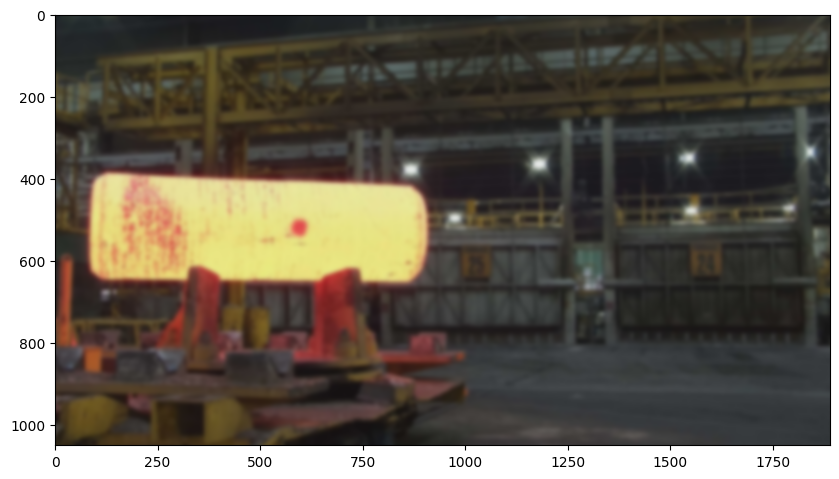

In [27]:
d=15
img_blur15 = cv2.GaussianBlur(input_image, (2*d+1, 2*d+1), -1)[d:-d,d:-d]

plt.imshow(cv2.cvtColor(img_blur15, cv2.COLOR_BGR2RGB))

--2023-10-09 19:01:03--  https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/hot_billet.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2377913 (2.3M) [image/jpeg]
Saving to: ‘hot_billet.jpg’

hot_billet.jpg      100%[===================>]   2.27M  --.-KB/s    in 0.08s   

2023-10-09 19:01:03 (27.9 MB/s) - ‘hot_billet.jpg’ saved [2377913/2377913]



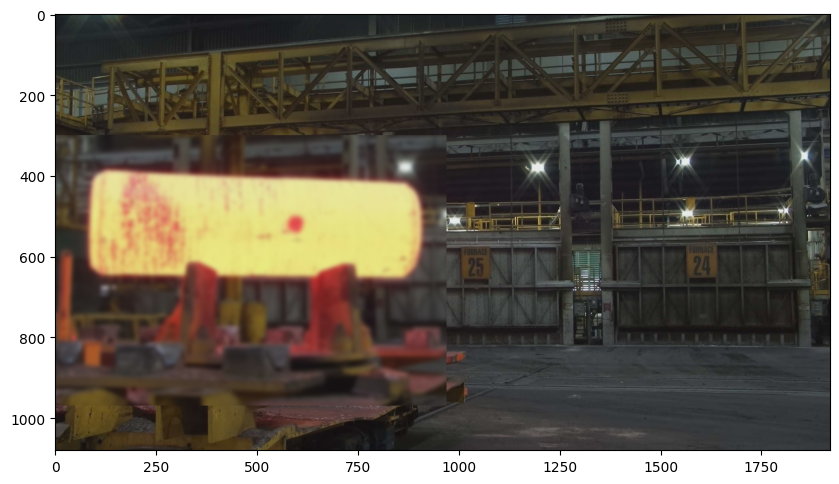

In [28]:
# EXERCISE !!

# In certain situations, image processing requires blurring certain aspects of an image - while keeping the rest in focus.

# Make 2x copies of the billet image.
# Crop the first copy to cover only the area contianing the hot-billet.
# Slightly blur the area containing the billet.
# paste the blurred billet contour on the original image copy.

!wget --no-check-certificate \
    https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/hot_billet.jpg \
    -O hot_billet.jpg

input_image = cv2.imread("hot_billet.jpg")
input_image2 = input_image
input_image2 = input_image2[300:1000, 0:1000]
plt.imshow(cv2.cvtColor(input_image2, cv2.COLOR_BGR2RGB))

d=15
img_blur3 = cv2.GaussianBlur(input_image2, (2*d+1, 2*d+1), -1)[d:-d,d:-d]
plt.imshow(cv2.cvtColor(img_blur3, cv2.COLOR_BGR2RGB))

input_image[300:300 + img_blur3.shape[0] , 0:0+img_blur3.shape[1]] = img_blur3
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))



## Edges

Edge detection is the final image processing technique we're going to look at in this tutorial.

For a lot of what we think of as "modern" computer vision techniques, edge detection functions as a building block. Fundamentally, edge detection works via **convolution**, similar to the term **convolutional neural networks**. Sobel's edge detector was one of the first truly successful edge detection (enhancement) technique and that involves convolution at its core. You can read more about the background to Sobel here in the OpenCV docs [here](https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_imgproc/py_gradients/py_gradients.html).

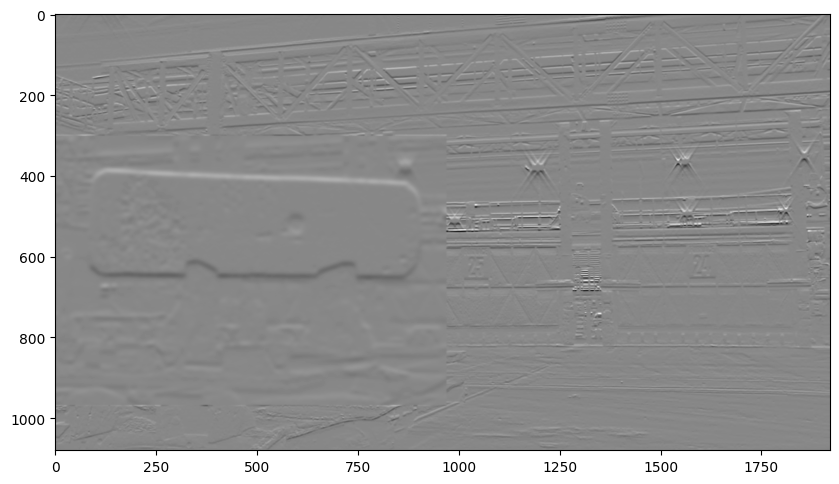

In [29]:
sobelimage=cv2.cvtColor(input_image,cv2.COLOR_BGR2GRAY)

sobelx = cv2.Sobel(sobelimage,cv2.CV_64F,1,0,ksize=9)
sobely = cv2.Sobel(sobelimage,cv2.CV_64F,0,1,ksize=9)
plt.imshow(sobely,cmap = 'gray')
# Sobel works in x and in y, change sobelx to sobely in the olt line above to see the difference


Canny edge detection is another winnning technique - it takes two thresholds.
The first one determines how likely Canny is to find an edge, and the second determines how likely it is to follow that edge once it's found. Investigate the effect of these thresholds by altering the values below.

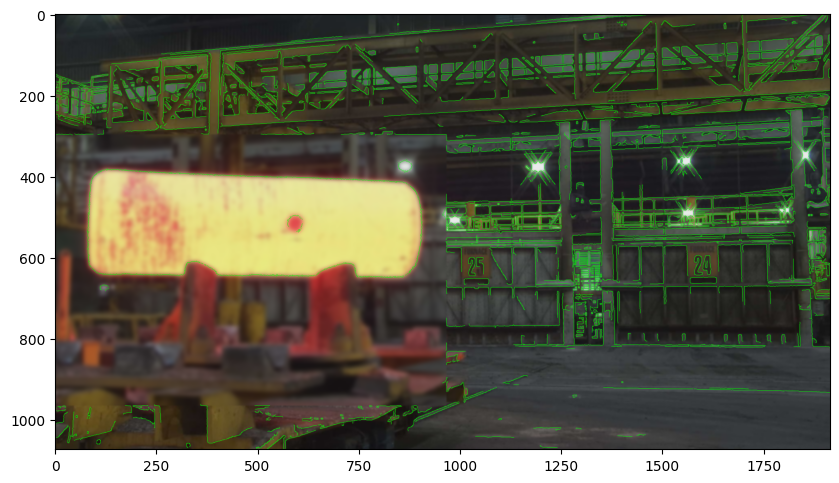

In [30]:
th1=30
th2=60 # Canny recommends threshold 2 is 3 times threshold 1 - you could try experimenting with this...
d=3 # gaussian blur

edgeresult=input_image.copy()
edgeresult = cv2.GaussianBlur(edgeresult, (2*d+1, 2*d+1), -1)[d:-d,d:-d]

gray = cv2.cvtColor(edgeresult, cv2.COLOR_BGR2GRAY)

edge = cv2.Canny(gray, th1, th2)

edgeresult[edge != 0] = (0, 255, 0) # this takes pixels in edgeresult where edge non-zero colours them bright green

plt.imshow(cv2.cvtColor(edgeresult, cv2.COLOR_BGR2RGB))

# Cascade Classification

One of the most impactful tools with vision is object detection.

Object Detection using Haar feature-based cascade classifiers is an effective object detection method proposed by Paul Viola and Michael Jones in their [paper](https://www.cs.cmu.edu/~efros/courses/LBMV07/Papers/viola-cvpr-01.pdf) and improved later by [Rainer Lienhart](http://wiki.opencv.org.cn/images/5/52/MRL-TR-May02-revised-Dec02.pdf).

It is a machine learning based approach where a cascade function is trained from a lot of positive and negative images. It is then used to detect objects in other images.

OpenCV provides a training method ( see [Cascade Classifier Training](https://docs.opencv.org/3.4/dc/d88/tutorial_traincascade.html)) or pretrained models, that can be read using the cv2.CascadeClassifierload method. The pre-*trained* models are located in the data folder in the OpenCV installation or can be found [here](https://github.com/opencv/opencv/tree/3.4/data).

In this notebook we will play with some of the provided pre-trained haarcascades models. More on this topic can be found [here](https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html).

<p>
 Estimated time needed: <strong>20 min</strong>
</p>

In [31]:
# Download the test image and utils files

!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/test.jpg \
    -O test.jpg

!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml \
    -O haarcascade_frontalface_default.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_smile.xml \
    -O haarcascade_smile.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_eye.xml \
    -O haarcascade_eye.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py

# these imports let you use opencv
import cv2 #opencv itself
import common #some useful opencv functions
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
%matplotlib inline
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

--2023-10-09 19:01:06--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/test.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 240458 (235K) [image/jpeg]
Saving to: ‘test.jpg’

test.jpg            100%[===================>] 234.82K  --.-KB/s    in 0.04s   

2023-10-09 19:01:06 (5.78 MB/s) - ‘test.jpg’ saved [240458/240458]

--2023-10-09 19:01:06--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awai

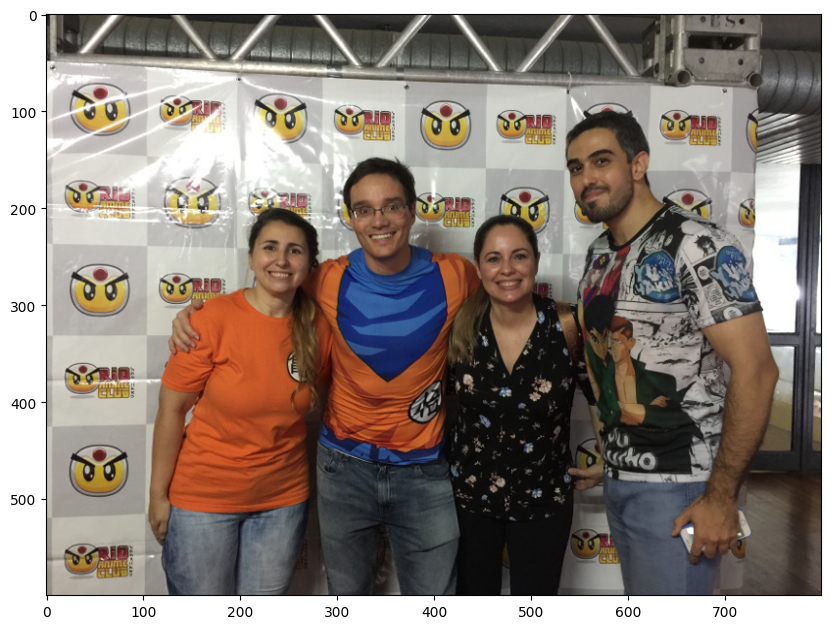

In [32]:
# Load the test image and create a greyscale copy of it to be used in the classifiers

base_image = cv2.imread('test.jpg')
grey = cv2.cvtColor(base_image, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

## Face Detection

We will use the pre-trained model haarcascade_frontalface_default.xml to detect faces in the photo. You can find more details about the parameters ofthe detectMultiScale function [here](https://docs.opencv.org/3.4/d1/de5/classcv_1_1CascadeClassifier.html#aaf8181cb63968136476ec4204ffca498).

**Note**: In all examples, I reload the color image again, because the imshow function rewrites the original image with the boxes, but I use the same grayscale image for detection)

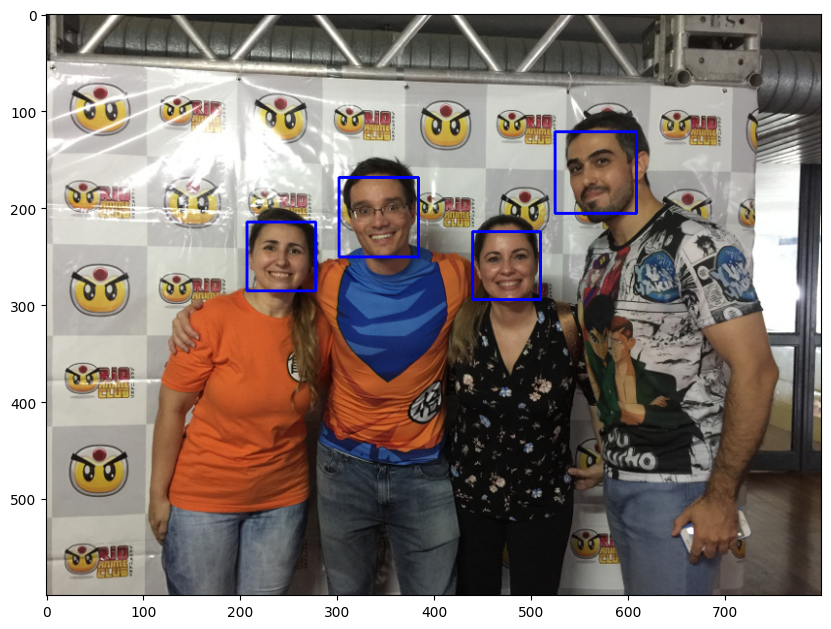

In [33]:
# this is a pre-trained face cascade
test_image = cv2.imread('test.jpg')
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
faces = face_cascade.detectMultiScale(grey, 1.3, 5)
for (x,y,w,h) in faces:
     cv2.rectangle(test_image,(x,y),(x+w,y+h),(255,0,0),2)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

### Smile Detection

We will use the pre-trained model haarcascade_smile.xml to detect smiles on the pictures.

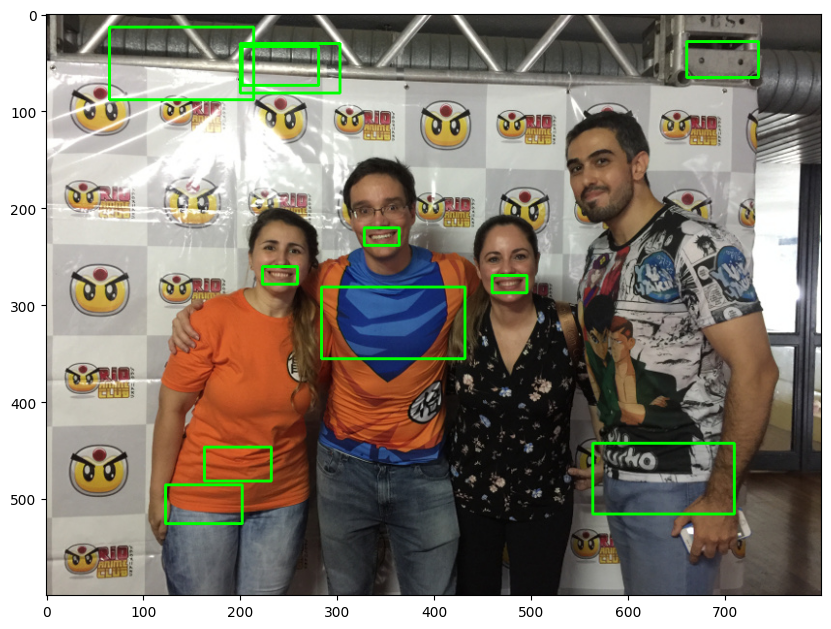

In [34]:
# this is a pre-trained face cascade
test_image = cv2.imread('test.jpg')
smile_cascade = cv2.CascadeClassifier('haarcascade_smile.xml')
smiles = smile_cascade.detectMultiScale(grey, 1.3, 20)
for (x,y,w,h) in smiles:
     cv2.rectangle(test_image,(x,y),(x+w,y+h),(0,255,0),2)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

As you can see, it detected the smiles correctly (the right guy, who is actually me, is not giving a full smile) but there are a lot of false positives, as usual in cascade models. Therefore, to improve this, we will only consider detected smiles inside previously detected faces.

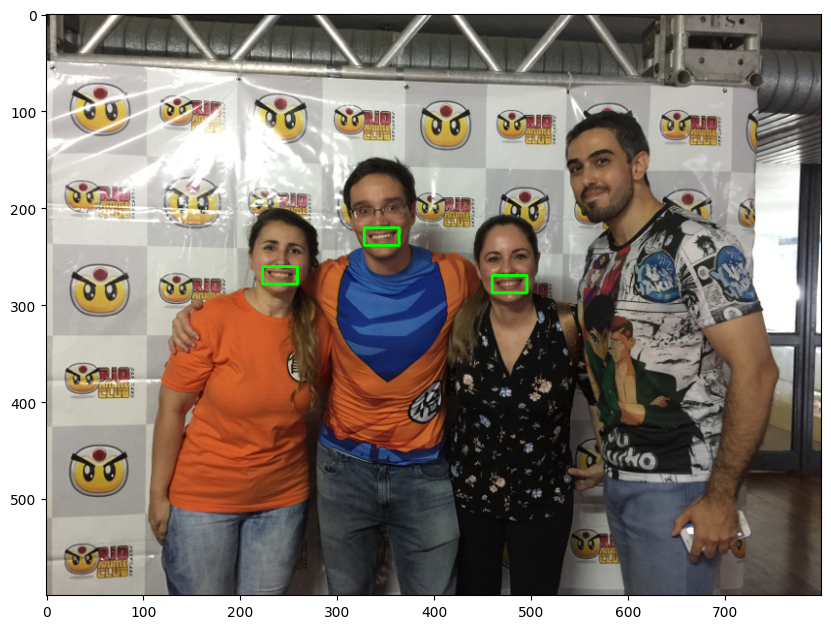

In [35]:
# this is a pre-trained face cascade
test_image = cv2.imread('test.jpg')
for (x,y,w,h) in faces:
  for (x_s,y_s,w_s,h_s) in smiles:
    if( (x <= x_s) and (y <= y_s) and ( x+w >= x_s+w_s) and ( y+h >= y_s+h_s)):
      cv2.rectangle(test_image, (x_s,y_s),(x_s+w_s,y_s+h_s),(0,255,0),2)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

## Eye Detection

Using the pre-trained model haarcascade_frontalface_default.xml to detect faces on the pictures.

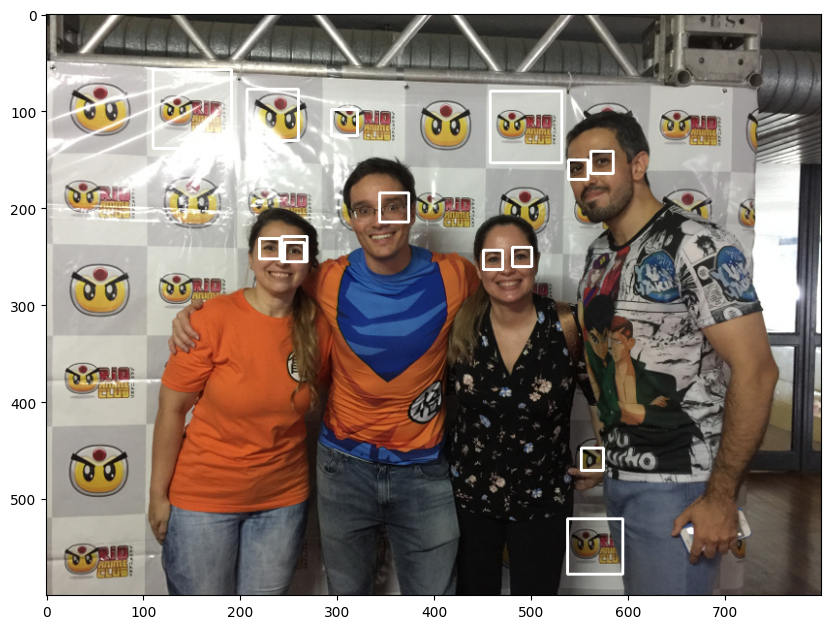

In [36]:
test_image = cv2.imread('test.jpg')
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
eyes = eye_cascade.detectMultiScale(grey, 1.3, 1)
for (x,y,w,h) in eyes:
     cv2.rectangle(test_image,(x,y),(x+w,y+h),(255,255,255),2)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

Similar to what happened to the smiles, there is a few of false positives, and in this particular case a false negative (probably the glass confused the classifier). So we will use the same approach to filter recognized eyes that are inside faces.

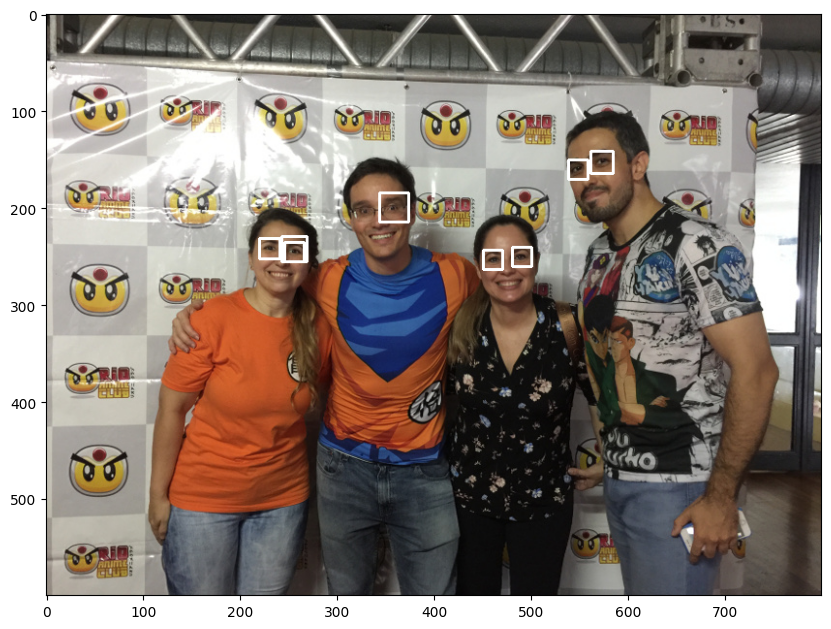

In [37]:
test_image = cv2.imread('test.jpg')
for (x,y,w,h) in faces:
  #cv2.rectangle(smile_faces_base_image,(x,y),(x+w,y+h),(255,0,0),2)
  for (x_s,y_s,w_s,h_s) in eyes:
    if( (x <= x_s) and (y <= y_s) and ( x+w >= x_s+w_s) and ( y+h >= y_s+h_s)):
      cv2.rectangle(test_image, (x_s,y_s),(x_s+w_s,y_s+h_s),(255,255,255),2)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

## Putting all together



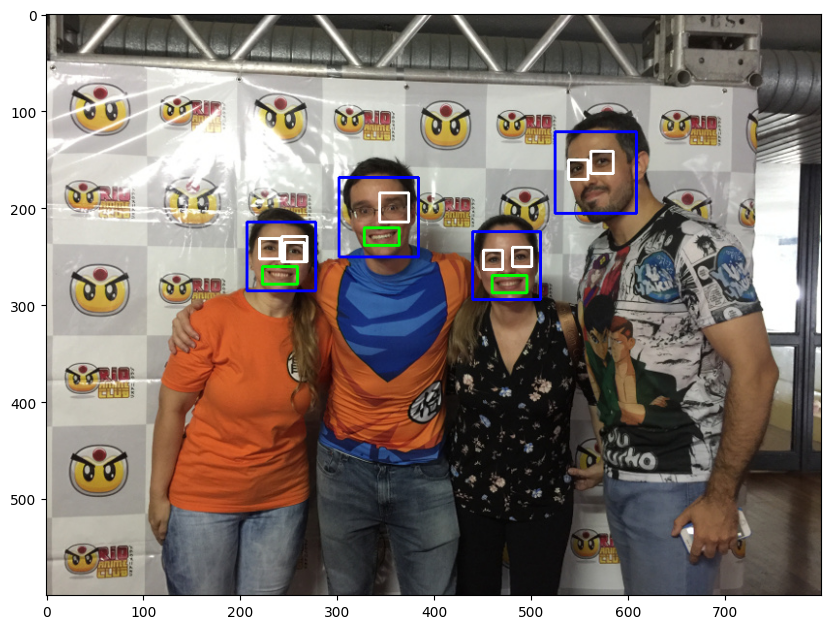

In [38]:
test_image = cv2.imread('test.jpg')
for (x,y,w,h) in faces:
  cv2.rectangle(test_image,(x,y),(x+w,y+h),(255,0,0),2)
  for (x_s,y_s,w_s,h_s) in eyes:
    if( (x <= x_s) and (y <= y_s) and ( x+w >= x_s+w_s) and ( y+h >= y_s+h_s)):
      cv2.rectangle(test_image, (x_s,y_s),(x_s+w_s,y_s+h_s),(255,255,255),2)
  for (x_s,y_s,w_s,h_s) in smiles:
    if( (x <= x_s) and (y <= y_s) and ( x+w >= x_s+w_s) and ( y+h >= y_s+h_s)):
      cv2.rectangle(test_image, (x_s,y_s),(x_s+w_s,y_s+h_s),(0,255,0),2)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))

# Modern Object Recognition

Although most of this type of object detection has recently been replaced in the industry by solutions based on Deep Neural Networks models created and trained in platforms like [TensorFlow](https://www.tensorflow.org/), the Viola Jones method for face detection is still a really well respected detector.
And even in modern DNN-based systems OpenCV is still widely used for image manipulation, pre and post-processing .


# YOLO and COCO object recognition basics in Python

By [Mikolaj Buchwald (LI profile)](https://www.linkedin.com/in/mikolaj-buchwald/) -- [mikbuch's GitHub](github.com/mikbuch)

This tutorial is an adaptation of [the example](https://opencv-tutorial.readthedocs.io/en/latest/yolo/yolo.html) explained in the official OpenCV YOLO documentation. The reason for creating this Notebook is that I myself had difficulties recreating this example based on the aforementioned documentation. That is why I created this step-by-step Notebook when you can re-run all cells and get to know YOLO and coco better.

## YOLO -- an object detection network

> _YOLO — You Only Look Once — is an extremely fast multi object detection algorithm which uses convolutional neural network (CNN) to detect and identify objects._
>
> _The neural network has this network architecture._
>
> ![YOLO network archtecture](https://github.com/nherscovici/PCC-Conference/blob/main/yolo1_net.png?raw=1)
>
> Source: https://arxiv.org/pdf/1506.02640.pdf

I quote this explanation from: [OpenCV YOLO tutorial](https://opencv-tutorial.readthedocs.io/en/latest/yolo/yolo.html)


## COCO -- class labels for 80 objects

The class names are stored in the `coco.names` text file:

In [39]:
# Clone The Repository Files
!git clone https://github.com/mikbuch/yolo-coco-opencv-example.git yolo_cv

Cloning into 'yolo_cv'...
remote: Enumerating objects: 29, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 29 (delta 10), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (29/29), 1.44 MiB | 7.24 MiB/s, done.
Resolving deltas: 100% (10/10), done.


In [40]:
# Check The Count of Labeled Names
!cat ./yolo_cv/coco.names | wc -l

80


In [41]:
# Obtain a Small Sample of Label Names
!cat ./yolo_cv/coco.names | head

person
bicycle
car
motorcycle
airplane
bus
train
truck
boat
traffic light


## Troubleshooting/important notes

### High resolution images

Note, in order to use the code from this notebook with larger resolution images, you will have to adjust border width and font size in the cells below, else the borders will be very thin, almost unvisible on the final rendered picture, and the font size will be extremely small.

### `net.getUnconnectedOutLayers()` vector or matrix

It seems that, depending on the (OpenCV?) implementation, the `net.getUnconnectedOutLayers()` can be either a vector or a matrix. This problem is dealt with in this Notebook by `try`-`except` clause, but pay attention to that in your own use cases.


## Import prerequisites

As a matter of fact, we will need OpenCV for Python in this example (i.e., `cv2`). It is usually (by convention) imported like that: `import cv2`.

In [42]:
import cv2
import numpy as np
import os
import time

from matplotlib import pyplot as plt

## Example image

OpenCV tutorial example image: https://opencv-tutorial.readthedocs.io/en/latest/_images/horse.jpg.  

In [43]:
img_name = './yolo_cv/horse.jpg'

# Reading image to an object (we will display it in the next step).
img = cv2.imread(img_name)

### Color conversion while displaying the image

Matplotlib interprets images in RGB format, but OpenCV uses BGR format

So to convert the image so that it's properly loaded, convert it before loading (for details, see: https://www.codegrepper.com/code-examples/python/imshow+wrong+colors).

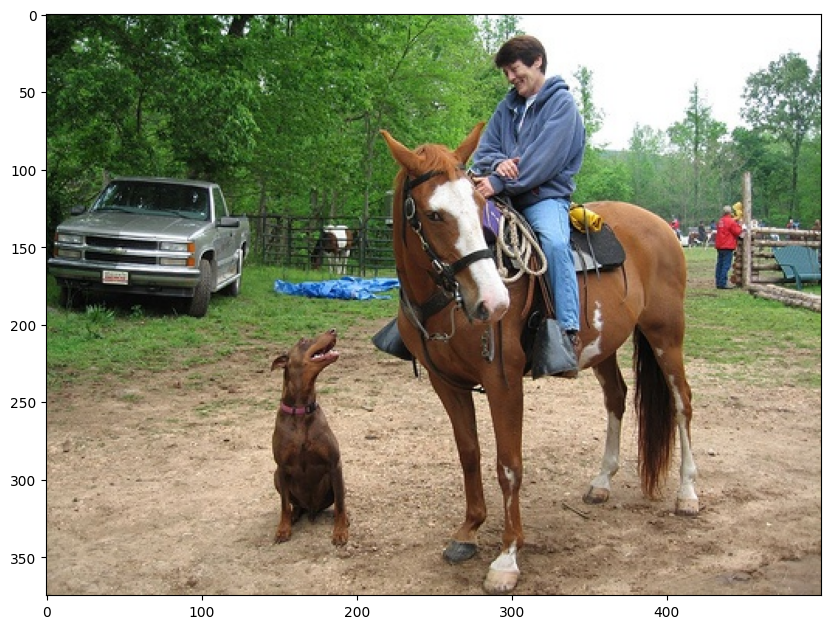

In [44]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

> _Load the YOLO network_
>
> _In order to run the network you will have to download the pre-trained YOLO weight file (237 MB). https://pjreddie.com/media/files/yolov3.weights_
>
> _Also download the the YOLO configuration file._
>
> _[yolov3.cfg](https://opencv-tutorial.readthedocs.io/en/latest/_downloads/10e685aad953495a95c17bfecd1649e5/yolov3.cfg)_

Source: https://opencv-tutorial.readthedocs.io/en/latest/yolo/yolo.html#load-the-yolo-network

#### Downloading the `yolov3.weights` file

The `yolov3.weights` file is pretty large, hence I couldn't include it in the reporitory with this example. We will have to make sure that this file is available for you -- by downloading the file:

In [45]:
!wget -O yolov3.weights https://pjreddie.com/media/files/yolov3.weights

--2023-10-09 19:01:16--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  46.0MB/s    in 5.6s    

2023-10-09 19:01:22 (42.2 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [46]:
# Load names of classes and get random colors for them.
classes = open('yolo_cv/coco.names').read().strip().split('\n')
np.random.seed(42)
colors = np.random.randint(0, 255, size=(len(classes), 3), dtype='uint8')

# Give the configuration and weight files for the model and load the network.
net = cv2.dnn.readNetFromDarknet('yolo_cv/yolov3.cfg', 'yolov3.weights')
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
#net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

# Show the network object
net

< cv2.dnn.Net 0x7e02f0e974b0>

## Determine the output layer

In [47]:
# First, get layer names
ln = net.getLayerNames()
len(ln)

254

In [48]:
# Show names of all layers
print(ln)

('conv_0', 'bn_0', 'leaky_1', 'conv_1', 'bn_1', 'leaky_2', 'conv_2', 'bn_2', 'leaky_3', 'conv_3', 'bn_3', 'leaky_4', 'shortcut_4', 'conv_5', 'bn_5', 'leaky_6', 'conv_6', 'bn_6', 'leaky_7', 'conv_7', 'bn_7', 'leaky_8', 'shortcut_8', 'conv_9', 'bn_9', 'leaky_10', 'conv_10', 'bn_10', 'leaky_11', 'shortcut_11', 'conv_12', 'bn_12', 'leaky_13', 'conv_13', 'bn_13', 'leaky_14', 'conv_14', 'bn_14', 'leaky_15', 'shortcut_15', 'conv_16', 'bn_16', 'leaky_17', 'conv_17', 'bn_17', 'leaky_18', 'shortcut_18', 'conv_19', 'bn_19', 'leaky_20', 'conv_20', 'bn_20', 'leaky_21', 'shortcut_21', 'conv_22', 'bn_22', 'leaky_23', 'conv_23', 'bn_23', 'leaky_24', 'shortcut_24', 'conv_25', 'bn_25', 'leaky_26', 'conv_26', 'bn_26', 'leaky_27', 'shortcut_27', 'conv_28', 'bn_28', 'leaky_29', 'conv_29', 'bn_29', 'leaky_30', 'shortcut_30', 'conv_31', 'bn_31', 'leaky_32', 'conv_32', 'bn_32', 'leaky_33', 'shortcut_33', 'conv_34', 'bn_34', 'leaky_35', 'conv_35', 'bn_35', 'leaky_36', 'shortcut_36', 'conv_37', 'bn_37', 'leaky_

In [49]:
# Get output layers
net.getUnconnectedOutLayers()

array([200, 227, 254], dtype=int32)

It seems that, depending on the (OpenCV?) implementation, the `net.getUnconnectedOutLayers()` can be either a vector or a matrix. This problem is dealt with in this Notebook by `try`-`except` clause, but pay attention to that in your own use cases.

In [50]:
# Show the names of this layers
try:
    print([ln[i[0] - 1] for i in net.getUnconnectedOutLayers()])
except IndexError:
    print([ln[i - 1] for i in net.getUnconnectedOutLayers()])

['yolo_82', 'yolo_94', 'yolo_106']


In [51]:
# Use this layers
try:
    ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]
except IndexError:
    ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]

ln

['yolo_82', 'yolo_94', 'yolo_106']

Blob is an input to the YOLO network.

Blob shape=(1, 3, 416, 416)


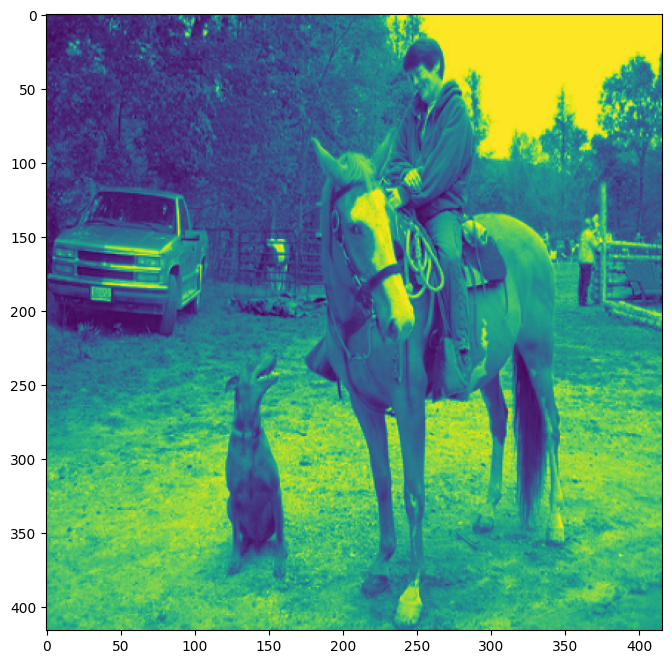

In [52]:
# Construct a blob from the image
blob = cv2.dnn.blobFromImage(img, 1/255.0, (416, 416), swapRB=True, crop=False)
r = blob[0, 0, :, :]

plt.imshow(r)
print('Blob shape=%s' % (blob.shape,))

In [53]:
net.setInput(blob)
t0 = time.time()
outputs = net.forward(ln)
t = time.time()
print('It took %.3f seconds to process the image.' % (t-t0))

It took 3.423 seconds to process the image.


The outputs object are vectors of lenght 85 (4 + 1 + 80):

    4x the bounding box (centerx, centery, width, height)
    1x box confidence
    80x class confidence


In [54]:
print('Found %s objects.' % len(outputs))

print('\nEnlisting objects:')
print([out.shape for out in outputs])

Found 3 objects.

Enlisting objects:
[(507, 85), (2028, 85), (8112, 85)]


Image preview:


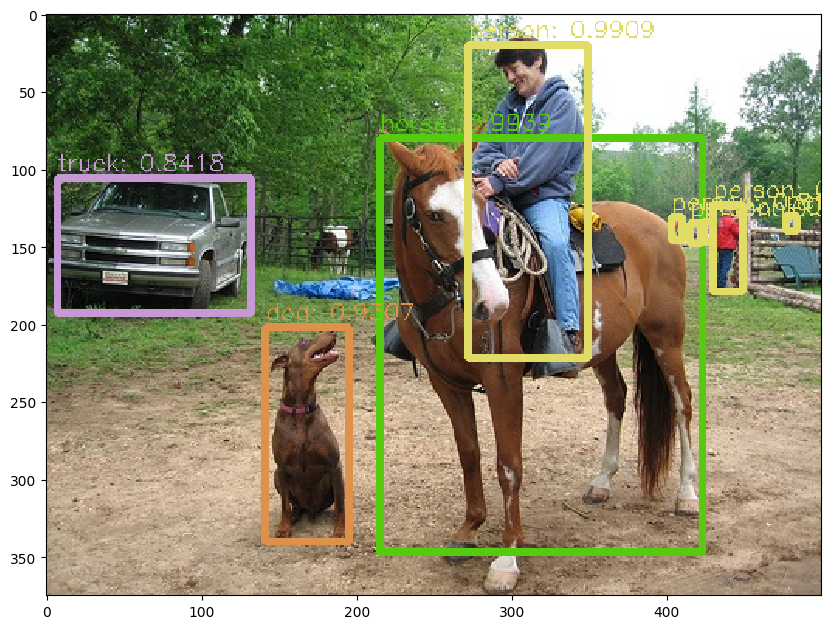

In [55]:
boxes = []
confidences = []
classIDs = []
h, w = img.shape[:2]

for output in outputs:
    for detection in output:
        scores = detection[5:]
        classID = np.argmax(scores)
        confidence = scores[classID]
        if confidence > 0.5:
            box = detection[:4] * np.array([w, h, w, h])
            (centerX, centerY, width, height) = box.astype("int")
            x = int(centerX - (width / 2))
            y = int(centerY - (height / 2))
            box = [x, y, int(width), int(height)]
            boxes.append(box)
            confidences.append(float(confidence))
            classIDs.append(classID)

indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
if len(indices) > 0:
    for i in indices.flatten():
        (x, y) = (boxes[i][0], boxes[i][1])
        (w, h) = (boxes[i][2], boxes[i][3])
        color = [int(c) for c in colors[classIDs[i]]]

        #  -- Arguments for CV2 rectangle:
        # cv2.rect   (img,  x, y,   width, height, color, line width)
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 4)

        # Labels and confidences for the image
        text = "{}: {:.4f}".format(classes[classIDs[i]], confidences[i])
        cv2.putText(img, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

print('Image preview:')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), interpolation='none')

## Write image to the output file

In [56]:
cv2.imwrite('output.png', img)

True

## Show image with bounding boxes

### Color conversion

Matplotlib interprets images in RGB format, but OpenCV uses BGR format. So to convert the image so that it's properly loaded, convert it before loading (for details, see: https://www.codegrepper.com/code-examples/python/imshow+wrong+colors)

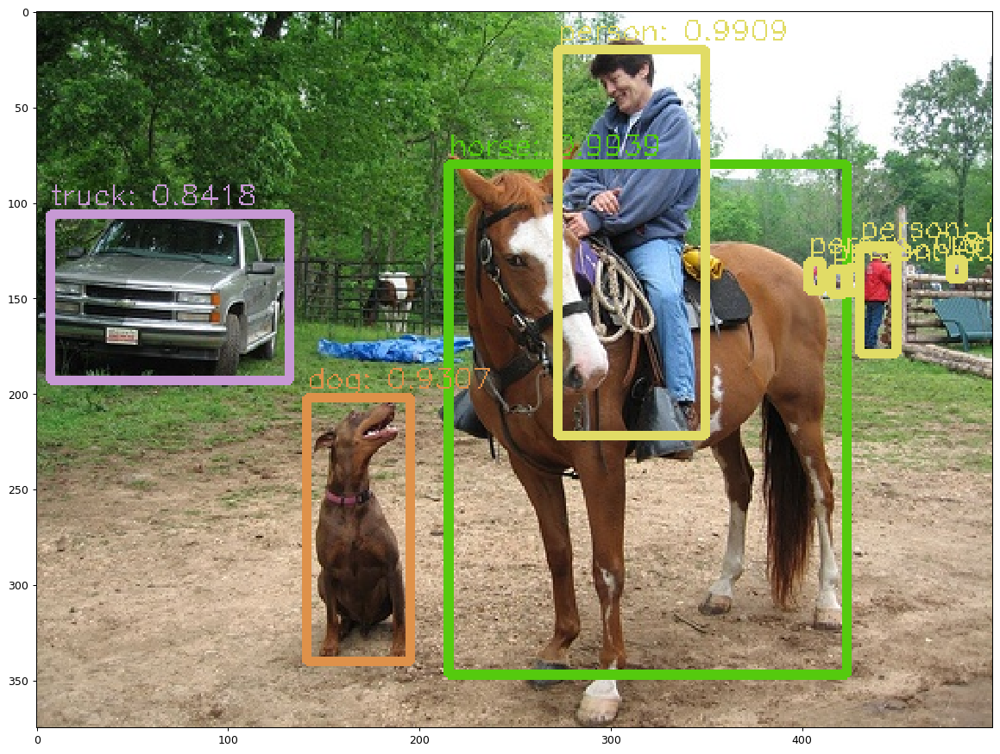

In [57]:
fig, ax = plt.subplots(figsize=(20, 12), dpi=90)
ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), interpolation='none')

# YOLO Object Detection Using OpenCV and A Video


In [40]:
# import the necessary packages
import numpy as np
import argparse
import imutils
import time
import cv2
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import os

In [39]:
# Clone the necessary project files
!git clone https://github.com/msalmankhaliq/YOLO-Object-detection-using-OpenCv.git yolo-coco
!wget --no-check-certificate \
    https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/video_test.mp4 \
    -O video_test.mp4
!wget --no-check-certificate \
    https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3-tiny.cfg \
    -O yolo-coco/coco/yolov3-tiny.cfg

fatal: destination path 'yolo-coco' already exists and is not an empty directory.
--2023-10-09 19:25:16--  https://raw.githubusercontent.com/nherscovici/PCC-Conference/main/video_test.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2503640 (2.4M) [application/octet-stream]
Saving to: ‘video_test.mp4’

video_test.mp4      100%[===================>]   2.39M  --.-KB/s    in 0.05s   

2023-10-09 19:25:17 (43.8 MB/s) - ‘video_test.mp4’ saved [2503640/2503640]

--2023-10-09 19:25:17--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3-tiny.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109

## YOLO Parameter and path Setup

In [42]:
#open the Yolo directory and set confidence for predicting
yolo_dir = os.path.join("yolo-coco/coco")
conf=0.3

In [43]:
# Set The Threshold for Predicting|
threshold = 0.2

In [44]:
# Prepare the Video Path that will be used
video = os.path.join("video_test.mp4")
video

'video_test.mp4'

In [45]:
# load the COCO class labels our YOLO model was trained on
labelsPath = os.path.sep.join([yolo_dir, "coco.names"])
LABELS = open(labelsPath).read().strip().split("\n")


In [46]:
# Verify the class LABELS were loaded
LABELS[0:5]

['person', 'bicycle', 'car', 'motorbike', 'aeroplane']

In [47]:
# initialize a list of colors to represent each possible class label
np.random.seed(42)
COLORS = np.random.randint(0, 255, size=(len(LABELS), 3),
	dtype="uint8")

In [48]:
# derive the paths to the YOLO weights and model configuration
weightsPath = os.path.sep.join([yolo_dir, "yolov3-tiny.weights"])
configPath = os.path.sep.join([yolo_dir, "yolov3-tiny.cfg"])

weightsPathLarge = os.path.sep.join([yolo_dir, "yolov3.weights"])
configPathLarge = os.path.sep.join([yolo_dir, "yolov3.cfg"])

In [49]:
#Display the Configuration Path
configPath

'yolo-coco/coco/yolov3-tiny.cfg'

In [50]:
# Display the Weight Path
weightsPath

'yolo-coco/coco/yolov3-tiny.weights'

In [51]:
# Download Small and Large Pretrained Yolo Model Into the Weights Path
!wget --no-check-certificate \
    https://pjreddie.com/media/files/yolov3-tiny.weights \
    -O yolo-coco/coco/yolov3-tiny.weights

# Large Model
!wget --no-check-certificate \
    https://pjreddie.com/media/files/yolov3.weights \
    -O yolo-coco/coco/yolov3.weights

--2023-10-09 19:25:25--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘yolo-coco/coco/yolov3-tiny.weights’

yolo-coco/coco/yolo 100%[===================>]  33.79M  45.9MB/s    in 0.7s    

2023-10-09 19:25:26 (45.9 MB/s) - ‘yolo-coco/coco/yolov3-tiny.weights’ saved [35434956/35434956]

--2023-10-09 19:25:26--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolo-coco/coco/yolov3.weights’

yolo-coco/coco/yolo 100%[===================>] 236.52M  75.2MB/s    in 3.1s    

2023-10-09 19:25:29 (75.2 MB/s) - ‘yolo-

In [52]:
# load our YOLO object detector trained on COCO dataset (80 classes)
# and determine only the *output* layer names that we need from YOLO
print("[INFO] loading YOLO from disk...")
net_small = cv2.dnn.readNetFromDarknet(configPath, weightsPath)
ln = net_small.getLayerNames()

net_large = cv2.dnn.readNetFromDarknet(configPathLarge, weightsPathLarge)
ln_large = net_large.getLayerNames()

[INFO] loading YOLO from disk...


In [53]:
# Get Output Layers
outputLayers = [ln[i-1] for i in net_small.getUnconnectedOutLayers()]
outputLayersLarge = [ln_large[i-1] for i in net_large.getUnconnectedOutLayers()]
outputLayers



['yolo_16', 'yolo_23']

## Video Initialization With OpenCV for Small Model

In [54]:
# initialize the video stream, pointer to output video file, and
# frame dimensions
vs = cv2.VideoCapture(video)
writer = None
(W, H) = (None, None)

# try to determine the total number of frames in the video file
try:
	prop = cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
		else cv2.CAP_PROP_FRAME_COUNT
	total = int(vs.get(prop))
	print("[INFO] {} total frames in video".format(total))

# an error occurred while trying to determine the total
# number of frames in the video file
except:
	print("[INFO] could not determine # of frames in video")
	print("[INFO] no approx. completion time can be provided")
	total = -1

[INFO] 229 total frames in video


In [55]:
# initialize the video stream, pointer to output video file, and
# frame dimensions
vs = cv2.VideoCapture(video)
writer = None
(W, H) = (None, None)

In [56]:
# try to determine the total number of frames in the video file
try:
	prop = cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
		else cv2.CAP_PROP_FRAME_COUNT
	total = int(vs.get(prop))
	print("[INFO] {} total frames in video".format(total))

# an error occurred while trying to determine the total
# number of frames in the video file
except:
	print("[INFO] could not determine # of frames in video")
	print("[INFO] no approx. completion time can be provided")
	total = -1

[INFO] 229 total frames in video


## Streaming the Video and Applying Object Detection Small Model

In [57]:
# loop over frames from the video file stream

frame_count = 0
frame_list = []
while True:
	# read the next frame from the file
	(grabbed, frame) = vs.read()
	frame_count +=1
	# if the frame was not grabbed, then we have reached the end
	# of the stream
	if not grabbed:
		break

	# if the frame dimensions are empty, grab them
	if W is None or H is None:
		(H, W) = frame.shape[:2]

	# construct a blob from the input frame and then perform a forward
	# pass of the YOLO object detector, giving us our bounding boxes
	# and associated probabilities
	blob = cv2.dnn.blobFromImage(frame, 1 / 255.0, (416, 416),
		swapRB=True, crop=False)
	net_small.setInput(blob)
	start = time.time()
	layerOutputs = net_small.forward(outputLayers)
	end = time.time()

	# initialize our lists of detected bounding boxes, confidences,
	# and class IDs, respectively
	boxes = []
	confidences = []
	classIDs = []

	# loop over each of the layer outputs
	for output in layerOutputs:
		# loop over each of the detections
		for detection in output:
			# extract the class ID and confidence (i.e., probability)
			# of the current object detection
			scores = detection[5:]
			classID = np.argmax(scores)
			confidence = scores[classID]

			# filter out weak predictions by ensuring the detected
			# probability is greater than the minimum probability
			if confidence > conf:
				# scale the bounding box coordinates back relative to
				# the size of the image, keeping in mind that YOLO
				# actually returns the center (x, y)-coordinates of
				# the bounding box followed by the boxes' width and
				# height
				box = detection[0:4] * np.array([W, H, W, H])
				(centerX, centerY, width, height) = box.astype("int")

				# use the center (x, y)-coordinates to derive the top
				# and and left corner of the bounding box
				x = int(centerX - (width / 2))
				y = int(centerY - (height / 2))

				# update our list of bounding box coordinates,
				# confidences, and class IDs
				boxes.append([x, y, int(width), int(height)])
				confidences.append(float(confidence))
				classIDs.append(classID)

	# apply non-maxima suppression to suppress weak, overlapping
	# bounding boxes
	idxs = cv2.dnn.NMSBoxes(boxes, confidences, conf,
		threshold)

	# ensure at least one detection exists
	if len(idxs) > 0:
		# loop over the indexes we are keeping
		for i in idxs.flatten():
			# extract the bounding box coordinates
			(x, y) = (boxes[i][0], boxes[i][1])
			(w, h) = (boxes[i][2], boxes[i][3])

			# draw a bounding box rectangle and label on the frame
			color = [int(c) for c in COLORS[classIDs[i]]]
			cv2.rectangle(frame, (x, y), (x + w, y + h), color, 2)
			text = "{}: {:.4f}".format(LABELS[classIDs[i]],
				confidences[i])
			cv2.putText(frame, text, (x, y - 5),
				cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

	# check if the video writer is None
	if writer is None:
		# initialize our video writer
		fourcc = cv2.VideoWriter_fourcc(*"MP4V")
		writer = cv2.VideoWriter("lio.mp4", fourcc, 30,
			(frame.shape[1], frame.shape[0]), True)

		# some information on processing single frame
		if total > 0:
			elap = (end - start)
			print("[INFO] single frame took {:.4f} seconds".format(elap))
			print("[INFO] estimated total time to finish: {:.4f}".format(
				elap * total))
	frame_list.append(frame)
 # Break after ten frames have written
 # Google COLAB takes long to process all frames
	if frame_count > 10:
		break
	# write the output frame to disk
	writer.write(frame)

[INFO] single frame took 0.5219 seconds
[INFO] estimated total time to finish: 119.5197


## Video Result of Two Different Frames For a Small Model

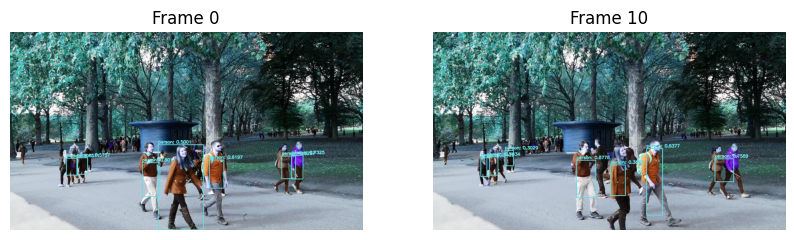

In [58]:
# Frame 1
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].axis('off')  # Hide axes
axs[1].axis('off')  # Hide axes
axs[0].set_title("Frame 0")
axs[1].set_title("Frame 10")
axs[0].imshow(frame_list[0])
axs[1].imshow(frame_list[9])
plt.show()

## Streaming and Applying Object Detection Using A Large Model

In [59]:
# Reset the Writer/Capture Variables
vs = cv2.VideoCapture(video)
writer = None
(W, H) = (None, None)

In [60]:
# try to determine the total number of frames in the video file
try:
	prop = cv2.cv.CV_CAP_PROP_FRAME_COUNT if imutils.is_cv2() \
		else cv2.CAP_PROP_FRAME_COUNT
	total = int(vs.get(prop))
	print("[INFO] {} total frames in video".format(total))

# an error occurred while trying to determine the total
# number of frames in the video file
except:
	print("[INFO] could not determine # of frames in video")
	print("[INFO] no approx. completion time can be provided")
	total = -1

[INFO] 229 total frames in video


In [61]:
# loop over frames from the video file stream

frame_count = 0
frame_list_large = []
while True:
	# read the next frame from the file
	(grabbed, frame) = vs.read()
	frame_count +=1
	# if the frame was not grabbed, then we have reached the end
	# of the stream
	if not grabbed:
		break

	# if the frame dimensions are empty, grab them
	if W is None or H is None:
		(H, W) = frame.shape[:2]

	# construct a blob from the input frame and then perform a forward
	# pass of the YOLO object detector, giving us our bounding boxes
	# and associated probabilities
	blob = cv2.dnn.blobFromImage(frame, 1 / 255.0, (416, 416),
		swapRB=True, crop=False)
	net_large.setInput(blob)
	start = time.time()
	layerOutputs = net_large.forward(outputLayersLarge)
	end = time.time()

	# initialize our lists of detected bounding boxes, confidences,
	# and class IDs, respectively
	boxes = []
	confidences = []
	classIDs = []

	# loop over each of the layer outputs
	for output in layerOutputs:
		# loop over each of the detections
		for detection in output:
			# extract the class ID and confidence (i.e., probability)
			# of the current object detection
			scores = detection[5:]
			classID = np.argmax(scores)
			confidence = scores[classID]

			# filter out weak predictions by ensuring the detected
			# probability is greater than the minimum probability
			if confidence > conf:
				# scale the bounding box coordinates back relative to
				# the size of the image, keeping in mind that YOLO
				# actually returns the center (x, y)-coordinates of
				# the bounding box followed by the boxes' width and
				# height
				box = detection[0:4] * np.array([W, H, W, H])
				(centerX, centerY, width, height) = box.astype("int")

				# use the center (x, y)-coordinates to derive the top
				# and and left corner of the bounding box
				x = int(centerX - (width / 2))
				y = int(centerY - (height / 2))

				# update our list of bounding box coordinates,
				# confidences, and class IDs
				boxes.append([x, y, int(width), int(height)])
				confidences.append(float(confidence))
				classIDs.append(classID)

	# apply non-maxima suppression to suppress weak, overlapping
	# bounding boxes
	idxs = cv2.dnn.NMSBoxes(boxes, confidences, conf,
		threshold)

	# ensure at least one detection exists
	if len(idxs) > 0:
		# loop over the indexes we are keeping
		for i in idxs.flatten():
			# extract the bounding box coordinates
			(x, y) = (boxes[i][0], boxes[i][1])
			(w, h) = (boxes[i][2], boxes[i][3])

			# draw a bounding box rectangle and label on the frame
			color = [int(c) for c in COLORS[classIDs[i]]]
			cv2.rectangle(frame, (x, y), (x + w, y + h), color, 2)
			text = "{}: {:.4f}".format(LABELS[classIDs[i]],
				confidences[i])
			cv2.putText(frame, text, (x, y - 5),
				cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

	# check if the video writer is None
	if writer is None:
		# initialize our video writer
		fourcc = cv2.VideoWriter_fourcc(*"MP4V")
		writer = cv2.VideoWriter("lio.mp4", fourcc, 30,
			(frame.shape[1], frame.shape[0]), True)

		# some information on processing single frame
		if total > 0:
			elap = (end - start)
			print("[INFO] single frame took {:.4f} seconds".format(elap))
			print("[INFO] estimated total time to finish: {:.4f}".format(
				elap * total))
	frame_list_large.append(frame)
 # Break after ten frames have written
 # Google COLAB takes long to process all frames
	if frame_count > 10:
		break
	# write the output frame to disk
	writer.write(frame)

[INFO] single frame took 4.5008 seconds
[INFO] estimated total time to finish: 1030.6780


## Video Result of Two Different Frames For a Large Model

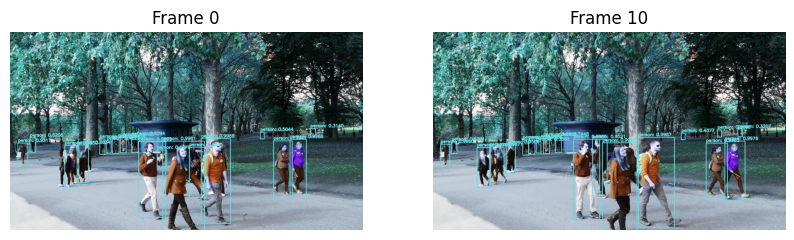

In [62]:
# Frame 1
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].axis('off')  # Hide axes
axs[1].axis('off')  # Hide axes
axs[0].set_title("Frame 0")
axs[1].set_title("Frame 10")
axs[0].imshow(frame_list_large[0])
axs[1].imshow(frame_list_large[9])
plt.show()

## Frame Comparison Between Both Models

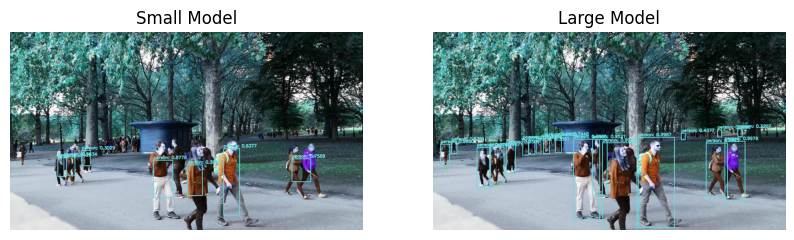

In [63]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].axis('off')  # Hide axes
axs[1].axis('off')  # Hide axes
axs[0].set_title("Small Model")
axs[1].set_title("Large Model")
axs[0].imshow(frame_list[9])
axs[1].imshow(frame_list_large[9])
plt.show()

In [64]:
# release the file pointers
print("[INFO] cleaning up...")
writer.release()
vs.release()

[INFO] cleaning up...
